#**Classification (Supervised Learning) - Using conventional ML models**

**Aim**: The objective is to study and examine the Trust pilot reviews sentiments on [TrustPilot](https://www.trustpilot.com/review/www.wexphotovideo.com) of Wex Photo Video using NLP. The data to be extracted and then existing conventional supervised models to be applied. The results to be observed and evaluated.  


In [ ]:
# Mounted data on drive so that it doesn't require upload every time google colab is loaded
from google.colab import drive
drive.mount('/content/CFA_Wex', force_remount= True)

Mounted at /content/CFA_Wex


##### **Installing Dependencies**

In [ ]:
!pip install contractions

!python -m spacy download en_core_web_lg

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 10.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.7/110.7 kB 13.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 587.7/587.7 MB 1.9 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_lg')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


##### **Required Python Libraries**

In [ ]:
# Scraping Libraries
import os
import time
import requests
import csv
import json
import re
from bs4 import BeautifulSoup
from datetime import datetime

# Dataset Libraries
import pandas as pd
import numpy as np

# Preprocessing Libraries
import contractions
import string
import spacy
from spacy import displacy
from spacy.lang.en.stop_words import STOP_WORDS
from collections import Counter
import nltk
from nltk.corpus import stopwords
from imblearn.over_sampling import SMOTE

# Visualization Libraries
import plotly.express as px
import plotly.graph_objects as go
pd.options.display.max_rows = 10
pd.plotting.register_matplotlib_converters()
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
print("Setup complete.")
import matplotlib.image as mpimg
import warnings
warnings.filterwarnings('ignore')

Setup complete.


In [ ]:
# ML Libraries
import xgboost as xgb
from sklearn.svm import SVC
from sklearn import preprocessing, model_selection, metrics
from sklearn.model_selection import GridSearchCV
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import MultinomialNB
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay, f1_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import TruncatedSVD
from joblib import Parallel, delayed

**Store path into a global variable**

In [ ]:
path = os.getcwd() + '/CFA_Wex/MyDrive/'

## **Web Scraping**

* Scrape data using **BeautifulSoup** - In case API key is not provided
* Extract data using API key via **requests** python module






### **Trust Pilot**

* Trust Pilot data extraction is done via API provided by Wex Engineering Team.



In [ ]:
# Global variables
api_key = "OSGJRidu1dtDuDBaiq16IU63Rqn4ZSX1"
# Date range can be 12 months, 6 months, 3 months, 30 days, 7 days, 2 days, last day, yesterday, today, this month
# Date also can be a custom date eg. 07/03/2024 in format dd/mm/yyyy.
#date_range = "12 months"
date_range = "2015-01-01"

In [ ]:
# Fetching business unit ID
def get_business_id():
  business_unit_id_url = f"https://api.trustpilot.com/v1/business-units/find/?apikey={api_key}&name=www.wexphotovideo.com"
  get_b_id_data = requests.get(business_unit_id_url)
  status, res = get_b_id_data.status_code, get_b_id_data.content
  if status == 200:
    data = json.loads(res)
    b_id = data["id"]
    return b_id
  else:
    print(f"ERROR: Status {status}. Please check.")
    return False

In [ ]:
def get_time_range():
  if re.search(". *[a-zA-Z]. *", date_range):
    get_date_range = date_range.upper()
    if get_date_range in ["12 MONTHS", "LAST 12 MONTHS"]:
      calculate_date = datetime.date.today() - datetime.timedelta(365)
      year, month, day = calculate_date.year, calculate_date.month, calculate_date.day
      start_date = str(year)+"-"+str(month)+"-"+str(day)+"T00:00:00"
      return start_date
    elif get_date_range in ["6 MONTHS", "LAST 6 MONTHS"]:
      calculate_date = datetime.date.today() - datetime.timedelta(180)
      year, month, day = calculate_date.year, calculate_date.month, calculate_date.day
      start_date = str(year)+"-"+str(month)+"-"+str(day)+"T00:00:00"
      return start_date
    elif get_date_range in ["3 MONTHS", "LAST 3 MONTHS"]:
      calculate_date = datetime.date.today() - datetime.timedelta(90)
      year, month, day = calculate_date.year, calculate_date.month, calculate_date.day
      start_date = str(year)+"-"+str(month)+"-"+str(day)+"T00:00:00"
      return start_date
    elif get_date_range in ["30 DAYS", "LAST 30 DAYS"]:
      calculate_date = datetime.date.today() - datetime.timedelta(60)
      year, month, day = calculate_date.year, calculate_date.month, calculate_date.day
      start_date = str(year)+"-"+str(month)+"-"+str(day)+"T00:00:00"
      return start_date
    elif get_date_range in ["7 DAYS", "LAST 7 DAYS"]:
      calculate_date = datetime.date.today() - datetime.timedelta(7)
      year, month, day = calculate_date.year, calculate_date.month, calculate_date.day
      start_date = str(year)+"-"+str(month)+"-"+str(day)+"T00:00:00"
      return start_date
    elif get_date_range in ["2 DAYS", "LAST 2 DAYS"]:
      calculate_date = datetime.date.today() - datetime.timedelta(2)
      year, month, day = calculate_date.year, calculate_date.month, calculate_date.day
      start_date = str(year)+"-"+str(month)+"-"+str(day)+"T00:00:00"
      return start_date
    elif get_date_range in ["1 DAY", "ONE DAY", "LAST DAY", "YESTERDAY"]:
      calculate_date = datetime.date.today() - datetime.timedelta(1)
      year, month, day = calculate_date.year, calculate_date.month, calculate_date.day
      start_date = str(year)+"-"+str(month)+"-"+str(day)+"T00:00:00"
      return start_date
    elif get_date_range in ["TODAY"]:
      calculate_date = datetime.date.today()
      year, month, day = calculate_date.year, calculate_date.month, calculate_date.day
      start_date = str(year)+"-"+str(month)+"-"+str(day)+"T00:00:00"
      return start_date
    elif get_date_range in ["THIS MONTH"]:
      input_dt = datetime.date.today()
      res = input_dt.replace(day=1)
      find_days_diff = input_dt - res
      find_days_diff = str(find_days_diff)
      get_day_no_str = find_days_diff.split(",")[0]
      get_day_no = get_day_no_str.split(" ")[0]

      calculate_date = datetime.date.today() - datetime.timedelta(int(get_day_no))
      year, month, day = calculate_date.year, calculate_date.month, calculate_date.day
      start_date = str(year)+"-"+str(month)+"-"+str(day)+"T00:00:00"
      return start_date
    else:
      print("Invalid date. Please choose from the date range selection only")
      return False
  else:
    return date_range+"T:00:00:00"

In [ ]:
# Create a list of URLs as per page_no_range global variable defined above
def create_url(stars="all", page_no_range=100):
  review_url_list = []
  business_unit_id = get_business_id()
  start_date = get_time_range()
  for i in range(1, page_no_range + 1):
    if stars == "all":
      reviews_url = f"https://api.trustpilot.com/v1/business-units/{business_unit_id}/reviews?apikey={api_key}&page={i}&language=en"
    else:
      reviews_url = f"https://api.trustpilot.com/v1/business-units/{business_unit_id}/reviews?apikey={api_key}&stars={stars}&page={i}&language=en"
    review_url_list.append(reviews_url)
  return review_url_list

In [ ]:
# Get all reviews data
def get_info(stars="all", page_no_range=100):
  final_info_dict_list = []
  business_unit_id = get_business_id()
  get_url_list = create_url(stars, page_no_range)
  for i in (get_url_list):
    review_data = requests.get(i)
    status, res = review_data.status_code, review_data.content
    if status == 200:
      parsed_dict = json.loads(res)
      for page_dict in parsed_dict['reviews']:
        final_info_dict_list.append({'review_title': page_dict['title'],
                                     'review_content': page_dict['text'],
                                     'review_experience_date': page_dict['experiencedAt'],
                                     'review_created_date': page_dict['createdAt'],
                                     'review_stars': page_dict['stars'],
                                     'reviewer_name': page_dict['consumer']['displayName'],
                                     'review_location': page_dict['consumer']['displayLocation'],
                                     'reviews_given': page_dict['consumer']['numberOfReviews']
                                     })
    else:
      print(f"ERROR: Status {status}. Unable to fetch data for page: {i+1}.")
      return False

  return final_info_dict_list

In [ ]:
def clear_csv(file_name):
  if os.path.exists(os.getcwd() + file_name):
    fo = open(os.getcwd() + file_name, "w")
    fo.writelines("")
    fo.close()

def write_csv_data(file_name, stars="all", page_no_range=100):
  # Get the page dict data
  page_data_dict_list = get_info(stars, page_no_range)
  for page_data in page_data_dict_list:
    try:
      with open(os.getcwd() + file_name, 'a', encoding = 'utf8', newline = '') as csvfile:
          fieldnames = ['Title', 'Content', 'Date of Experience',
                        'Review Date', 'Rating', 'Reviewer Name', 'Location',
                        'No of reviews given']
          writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
          is_file_empty = os.stat(os.getcwd() + file_name).st_size
          if is_file_empty == 0:
            writer.writeheader()
          writer.writerow({'Title': page_data['review_title'],
                           'Content': page_data['review_content'],
                           'Date of Experience': page_data['review_experience_date'],
                           'Review Date': page_data['review_created_date'],
                           'Rating': page_data['review_stars'],
                           'Reviewer Name': page_data['reviewer_name'],
                           'Location': page_data['review_location'],
                           'No of reviews given': page_data['reviews_given']})
          csvfile.close()
    except:
      print(f"Something unexpected happened. Please check the output.")

#####**Trust Pilot All Stars Reviews**

In [ ]:
%%time
clear_csv('/CFA_Wex/MyDrive/trustpilot_reviews_api.csv')
write_csv_data('/CFA_Wex/MyDrive/trustpilot_all_reviews_api.csv', stars="all", page_no_range=300)

CPU times: user 26.1 s, sys: 1.25 s, total: 27.4 s
Wall time: 2min 1s


#####**Trust Pilot 1 Star Reviews**

In [ ]:
%%time
clear_csv('/CFA_Wex/MyDrive/trustpilot_reviews_1_star_api.csv')
write_csv_data('/CFA_Wex/MyDrive/trustpilot_reviews_1_star_api.csv', stars="1", page_no_range=300)

CPU times: user 26.9 s, sys: 499 ms, total: 27.4 s
Wall time: 1min 33s


#####**Trust Pilot 2 Stars Reviews**

In [ ]:
%%time
clear_csv('/CFA_Wex/MyDrive/trustpilot_reviews_2_star_api.csv')
write_csv_data('/CFA_Wex/MyDrive/trustpilot_reviews_2_star_api.csv', stars="2", page_no_range=300)

CPU times: user 27.9 s, sys: 492 ms, total: 28.4 s
Wall time: 1min 29s


#####**Trust Pilot 3 Stars Reviews**

In [ ]:
%%time
clear_csv('/CFA_Wex/MyDrive/trustpilot_reviews_3_star_api.csv')
write_csv_data('/CFA_Wex/MyDrive/trustpilot_reviews_3_star_api.csv', stars="3", page_no_range=300)

CPU times: user 28.5 s, sys: 569 ms, total: 29 s
Wall time: 1min 39s


#####**Trust Pilot 4 Stars Reviews**

In [ ]:
%%time
clear_csv('/CFA_Wex/MyDrive/trustpilot_reviews_4_star_api.csv')
write_csv_data('/CFA_Wex/MyDrive/trustpilot_reviews_4_star_api.csv', stars="4", page_no_range=300)

CPU times: user 25 s, sys: 834 ms, total: 25.8 s
Wall time: 1min 40s


#####**Trust Pilot 5 Stars Reviews**

In [ ]:
%%time
clear_csv('/CFA_Wex/MyDrive/trustpilot_reviews_5_star_api.csv')
write_csv_data('/CFA_Wex/MyDrive/trustpilot_reviews_5_star_api.csv', stars="5", page_no_range=50)

#### **Converting Trust Pilot reviews to Pandas Dataframe**

In [ ]:
trust_pilot_1_star = pd.read_csv(path + '/trustpilot_reviews_1_star_api.csv')
trust_pilot_2_star = pd.read_csv(path + '/trustpilot_reviews_2_star_api.csv')
trust_pilot_3_star = pd.read_csv(path + '/trustpilot_reviews_3_star_api.csv')
trust_pilot_4_star = pd.read_csv(path + '/trustpilot_reviews_4_star_api.csv')
trust_pilot_5_star = pd.read_csv(path + '/trustpilot_reviews_5_star_api.csv')

#### **Combine all Trust Pilot Dataframes into a single df**

In [ ]:
trust_pilot_df = pd.concat([trust_pilot_1_star, trust_pilot_2_star, trust_pilot_3_star, trust_pilot_4_star, trust_pilot_5_star])

##### **Verify first 5 rows of data frame**

In [ ]:
trust_pilot_df.head()

,Title,Content,Date of Experience,Review Date,Rating,Reviewer Name,Location,No of reviews given
0,Took too long to arrive,Took too long to arrive. When I had to reautho...,2024-06-06T00:00:00Z,2024-06-12T10:06:55Z,1,Gordy,NaN,3
1,Zero packaging,Zero packaging. Bought an expensive scanner. T...,2024-05-25T00:00:00Z,2024-05-31T11:34:03Z,1,Carl Ritchie,NaN,8
2,Ordered a product only to be told in an…,Ordered a product only to be told in an automa...,2024-05-28T00:00:00Z,2024-05-28T21:07:37Z,1,Jonnie Yates,NaN,10
3,Brought used speedlight,"Brought used speedlight, unfortunately it arri...",2024-05-15T00:00:00Z,2024-05-21T11:14:23Z,1,Saying how it is,"London, GB",6
4,Really bad experience till now already…,Really bad experience till now already paid fo...,2024-05-15T00:00:00Z,2024-05-21T10:41:37Z,1,customer,NaN,1


##### **Verify last 5 rows of data frame**

In [ ]:
trust_pilot_df.tail()

,Title,Content,Date of Experience,Review Date,Rating,Reviewer Name,Location,No of reviews given
5995,Great service as always.,Great service as always.,2023-09-05T00:00:00Z,2023-09-12T12:26:04Z,5,Mr. Harrison,NaN,7
5996,Wex is always friendly knowledgable…,Wex is always friendly knowledgable respectful...,2023-08-29T00:00:00Z,2023-09-12T12:14:47Z,5,Adrian Schofield,NaN,5
5997,My order was delivered in under 24 hours,My order was delivered in under 24 hours,2023-09-05T00:00:00Z,2023-09-12T12:11:20Z,5,Howard,NaN,8
5998,Always ready to help.,Always ready to help.,2023-08-31T00:00:00Z,2023-09-12T11:53:19Z,5,alan thorpe,NaN,6
5999,Good customer service and very quick…,Good customer service and very quick delivery....,2023-09-05T00:00:00Z,2023-09-12T11:16:58Z,5,Linda Clarkson,NaN,21


### **Power Reviews**

* Power Reviews data extraction was tried to be performed via API provided by Wex Engineering Team.
* The API does not functionally works properly and provides redundant / unexpected data.
* To overcome the issue, for model training, the data is extracted manually from the Power Reviews website and stored as CSV.



In [ ]:
power_reviews_1_star = pd.read_csv(path + '/power_reviews_1_star_manual.csv')
power_reviews_2_star = pd.read_csv(path + '/power_reviews_2_star_manual.csv')
power_reviews_3_star = pd.read_csv(path + '/power_reviews_3_star_manual.csv')
power_reviews_4_star = pd.read_csv(path + '/power_reviews_4_star_manual.csv')
power_reviews_5_star = pd.read_csv(path + '/power_reviews_5_star_manual.csv')

In [ ]:
power_reviews_5_star.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91715 entries, 0 to 91714
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Created Date        91715 non-null  object 
 1   Product Name        91715 non-null  object 
 2   Brand Name          0 non-null      float64
 3   Page ID             91715 non-null  int64  
 4   Review Rating       91715 non-null  int64  
 5   Review Headline     91627 non-null  object 
 6   Review Comments     91628 non-null  object 
 7   Review Bottomline   9626 non-null   object 
 8   Review Location     91709 non-null  object 
 9   Locale              91715 non-null  object 
 10  Reviewer Type       91715 non-null  object 
 11  Review Email        9477 non-null   object 
 12  Review Nickname     91641 non-null  object 
 13  Site Status         91715 non-null  object 
 14  Is PWR Publishable  91715 non-null  bool   
 15  Page ID Variant     0 non-null      float64
 16  UGC 

**Since 5 star reviews are close to 92,000 whereas the others are within the range of 0 to 10,000 only, the 5 starts reviews are shrunk down to random 10,000**

In [ ]:
# Sample 10,000 random entries from power_reviews_5_star
power_reviews_5_star = power_reviews_5_star.sample(n=10000, random_state=42)

In [ ]:
power_reviews_5_star.shape

(10000, 17)

#### **Combine all Power Reviews Dataframes into a single df**

In [ ]:
power_reviews_df = pd.concat([power_reviews_1_star, power_reviews_2_star, power_reviews_3_star, power_reviews_4_star, power_reviews_5_star])

##### **Verify first 5 rows of data frame**

In [ ]:
power_reviews_df.head()

,Created Date,Product Name,Brand Name,Page ID,Review Rating,Review Headline,Review Comments,Review Bottomline,Review Location,Locale,Reviewer Type,Review Email,Review Nickname,Site Status,Is PWR Publishable,Page ID Variant,UGC ID
0,31/10/2018,Wex Photo Video,NaN,614293,1,Was not obvious how to apply manfrotto promoti...,Was not obvious how to apply manfrotto promoti...,NaN,GB,en_GB,Anonymous,NaN,aha25496,Published,True,NaN,214245518
1,03/07/2020,Wex Photo Video,NaN,614293,1,"usually a 5 star, but tried 4 times last nigh ...","usually a 5 star, but tried 4 times last nigh ...",NaN,GB,en_GB,Anonymous,NaN,aap18384,Published,True,NaN,282621694
2,08/10/2018,Wex Photo Video,NaN,614293,1,Hoping this is what we need.,Hoping this is what we need.,NaN,GB,en_GB,Anonymous,NaN,ana43053,Unpublished,False,NaN,211542206
3,28/06/2017,Wex Photo Video,NaN,614293,1,:((,:((,NaN,GB,en_GB,Anonymous,NaN,aaa9411,Unpublished,False,NaN,202589670
4,13/11/2021,Wex Photo Video,NaN,614293,1,Told to sign up for free delivery on my first ...,Told to sign up for free delivery on my first ...,NaN,GB,en_GB,Anonymous,NaN,ahz16431,Published,True,NaN,387596508


##### **Verify last 5 rows of data frame**

In [ ]:
power_reviews_df.tail()

,Created Date,Product Name,Brand Name,Page ID,Review Rating,Review Headline,Review Comments,Review Bottomline,Review Location,Locale,Reviewer Type,Review Email,Review Nickname,Site Status,Is PWR Publishable,Page ID Variant,UGC ID
38944,13/05/2016,Wex Photo Video,NaN,614293,5,Simple and starightforward,Simple and starightforward,NaN,GB,en_GB,Anonymous,NaN,tcp31333,Published,True,NaN,28943416
43331,09/08/2019,Wex Photo Video,NaN,614293,5,Excellent Service,Excellent Service,NaN,GB,en_GB,Anonymous,NaN,uza44043,Published,True,NaN,244900698
14005,17/08/2018,Wex Photo Video,NaN,614293,5,Very simple to find the product and order,Very simple to find the product and order,NaN,GB,en_GB,Anonymous,NaN,uhc3600,Published,True,NaN,196632859
81272,10/04/2023,Wex Photo Video,NaN,614293,5,Excellent smooth ordering system,Excellent smooth ordering system,NaN,GB,en_GB,Anonymous,NaN,oga32413,Published,True,NaN,451784486
17539,26/05/2020,Wex Photo Video,NaN,614293,5,very good,very good,NaN,GB,en_GB,Anonymous,NaN,abr48403,Published,True,NaN,277556026


##**Data exploration, visualizations and initial findinds / observations**

#### **Check the rows and columns fetched**

In [ ]:
trust_pilot_df.shape

(10794, 8)

In [ ]:
power_reviews_df.shape

(23784, 17)

#### **Check dataframes information**


In [ ]:
trust_pilot_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10794 entries, 0 to 5999
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Title                10794 non-null  object
 1   Content              10794 non-null  object
 2   Date of Experience   7211 non-null   object
 3   Review Date          10794 non-null  object
 4   Rating               10794 non-null  int64 
 5   Reviewer Name        10791 non-null  object
 6   Location             211 non-null    object
 7   No of reviews given  10794 non-null  int64 
dtypes: int64(2), object(6)
memory usage: 1017.0+ KB


In [ ]:
power_reviews_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 23784 entries, 0 to 17539
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Created Date        23784 non-null  object 
 1   Product Name        23784 non-null  object 
 2   Brand Name          0 non-null      float64
 3   Page ID             23784 non-null  int64  
 4   Review Rating       23784 non-null  int64  
 5   Review Headline     23730 non-null  object 
 6   Review Comments     23729 non-null  object 
 7   Review Bottomline   2094 non-null   object 
 8   Review Location     23782 non-null  object 
 9   Locale              23784 non-null  object 
 10  Reviewer Type       23784 non-null  object 
 11  Review Email        2100 non-null   object 
 12  Review Nickname     23765 non-null  object 
 13  Site Status         23784 non-null  object 
 14  Is PWR Publishable  23784 non-null  bool   
 15  Page ID Variant     0 non-null      float64
 16  UGC ID   

#### **Check First Review**

In [ ]:
trust_pilot_df['Content'].iloc[0]

'Took too long to arrive. When I had to reauthorise payment I was told that PayPal credit isn’t available because it took too long to arrive. '

In [ ]:
power_reviews_df['Review Comments'].iloc[0]

'Was not obvious how to apply manfrotto promotion code to order so I missed out big time on first  one . Second order by trial and error worked it out . Will be very weary of offers if I use you again.'

####**Finding out numeric and categorical columns**

In [ ]:
# Trust Pilot
tp_numerical_columns = trust_pilot_df.select_dtypes(include=['int64', 'float64']).columns
print("Columns with int64 and float64 data types are:-")
print(tp_numerical_columns)
print(f"Total: {len(tp_numerical_columns)}")
print("=====================================================================")
tp_categorical_columns = trust_pilot_df.select_dtypes(include=['object']).columns
print("Categorical columns (object data type):")
print(tp_categorical_columns)
print(f"Total: {len(tp_categorical_columns)}")

Columns with int64 and float64 data types are:-
Index(['Rating', 'No of reviews given'], dtype='object')
Total: 2
Categorical columns (object data type):
Index(['Title', 'Content', 'Date of Experience', 'Review Date',
       'Reviewer Name', 'Location'],
      dtype='object')
Total: 6


In [ ]:
# Power Reviews
pr_numerical_columns = power_reviews_df.select_dtypes(include=['int64', 'float64']).columns
print("Columns with int64 and float64 data types are:-")
print(pr_numerical_columns)
print(f"Total: {len(pr_numerical_columns)}")
print("=====================================================================")
pr_categorical_columns = power_reviews_df.select_dtypes(include=['object']).columns
print("Categorical columns (object data type):")
print(pr_categorical_columns)
print(f"Total: {len(pr_categorical_columns)}")

Columns with int64 and float64 data types are:-
Index(['Brand Name', 'Page ID', 'Review Rating', 'Page ID Variant', 'UGC ID'], dtype='object')
Total: 5
Categorical columns (object data type):
Index(['Created Date', 'Product Name', 'Review Headline', 'Review Comments',
       'Review Bottomline', 'Review Location', 'Locale', 'Reviewer Type',
       'Review Email', 'Review Nickname', 'Site Status'],
      dtype='object')
Total: 11


## **Data Cleansing, Sampling and Balancing**

## **Targets**

*   Handling Missing Values ✅
*   Remove Constant Features ✅
*   Data Balancing ✅

### **Trust Pilot**

#### **Handling Missing Values**

In [ ]:
trust_pilot_df.isnull().sum()

Title                      0
Content                    0
Date of Experience      3583
Review Date                0
Rating                     0
Reviewer Name              3
Location               10583
No of reviews given        0
dtype: int64

* Remove/drop Location attribute completely since as discovered in part above, >95% of the data values are missing.
* Remove Reviewers Name, No. of reviews given, review date, Date of Experience, title attribute as well since it won't assist in sentiment classification.



In [ ]:
# Display the DataFrame information before dropping the column
print("Before dropping the column:")
trust_pilot_df.info()

trust_pilot_df = trust_pilot_df.drop(['Location', 'Reviewer Name', 'No of reviews given', 'Title', 'Date of Experience', 'Review Date'], axis=1)

Before dropping the column:
<class 'pandas.core.frame.DataFrame'>
Index: 10794 entries, 0 to 5999
Data columns (total 8 columns):
 #   Column               Non-Null Count  Dtype 
---  ------               --------------  ----- 
 0   Title                10794 non-null  object
 1   Content              10794 non-null  object
 2   Date of Experience   7211 non-null   object
 3   Review Date          10794 non-null  object
 4   Rating               10794 non-null  int64 
 5   Reviewer Name        10791 non-null  object
 6   Location             211 non-null    object
 7   No of reviews given  10794 non-null  int64 
dtypes: int64(2), object(6)
memory usage: 1017.0+ KB


In [ ]:
# Display the DataFrame information after dropping the columns
print("After dropping the columns:")
trust_pilot_df.info()

After dropping the columns:
<class 'pandas.core.frame.DataFrame'>
Index: 10794 entries, 0 to 5999
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Content  10794 non-null  object
 1   Rating   10794 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 511.0+ KB


#### **Remove Constant Features**
*   Find out features which are constant.
*   Constant meaning the features which contains only single type of unique value

In [ ]:
const_attr = [v for v in trust_pilot_df.columns if trust_pilot_df[v].nunique() == 1]
print(const_attr)

[]


#### There are no constant features in the dataset

####**Rating Distribution**

In [ ]:
trust_pilot_df['Rating'].value_counts()

Rating
5    6000
4    2802
3     805
1     763
2     424
Name: count, dtype: int64

#### **Creating a chart for label distribution**

In [ ]:
fig = px.histogram(trust_pilot_df,x="Rating", color='Rating', title = 'Rating Distribution', labels={'Rating': 'rating', 'y': 'frequency'})
fig.update_layout(bargap=0.2)
fig.show()

### **Power Reviews**

#### **Handling Missing Values**

In [ ]:
pd.set_option('display.max_rows', None)
power_reviews_df.isnull().sum()

Created Date              0
Product Name              0
Brand Name            23784
Page ID                   0
Review Rating             0
Review Headline          54
Review Comments          55
Review Bottomline     21690
Review Location           2
Locale                    0
Reviewer Type             0
Review Email          21684
Review Nickname          19
Site Status               0
Is PWR Publishable        0
Page ID Variant       23784
UGC ID                    0
dtype: int64

* Remove/drop Created Date, Brand Name, Pade ID, Review Headline, Review Bottomline, Review Location, Locale, Reviewer Type, Review Email, Review Nickname, Site Status, Is PWR Publishable, Page ID Variant, UGC ID attributes from the dataframe as they won't be used for sentiment classification.


In [ ]:
# Display the DataFrame information before dropping the column
print("Before dropping the column:")
power_reviews_df.info()

power_reviews_df = power_reviews_df.drop(['Created Date', 'Brand Name', 'Page ID', 'Review Headline', 'Review Bottomline',
                                          'Review Location', 'Review Location', 'Locale', 'Reviewer Type', 'Review Email',
                                          'Review Nickname', 'Site Status', 'Is PWR Publishable', 'Page ID Variant', 'UGC ID'], axis=1)

Before dropping the column:
<class 'pandas.core.frame.DataFrame'>
Index: 23784 entries, 0 to 17539
Data columns (total 17 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Created Date        23784 non-null  object 
 1   Product Name        23784 non-null  object 
 2   Brand Name          0 non-null      float64
 3   Page ID             23784 non-null  int64  
 4   Review Rating       23784 non-null  int64  
 5   Review Headline     23730 non-null  object 
 6   Review Comments     23729 non-null  object 
 7   Review Bottomline   2094 non-null   object 
 8   Review Location     23782 non-null  object 
 9   Locale              23784 non-null  object 
 10  Reviewer Type       23784 non-null  object 
 11  Review Email        2100 non-null   object 
 12  Review Nickname     23765 non-null  object 
 13  Site Status         23784 non-null  object 
 14  Is PWR Publishable  23784 non-null  bool   
 15  Page ID Variant     0 non-null

In [ ]:
# Display the DataFrame information after dropping the columns
print("After dropping the columns:")
power_reviews_df.info()

After dropping the columns:
<class 'pandas.core.frame.DataFrame'>
Index: 23784 entries, 0 to 17539
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Product Name     23784 non-null  object
 1   Review Rating    23784 non-null  int64 
 2   Review Comments  23729 non-null  object
dtypes: int64(1), object(2)
memory usage: 1.2+ MB


#### **Drop rows where 'Review Comments' is missing**


In [ ]:
power_reviews_df = power_reviews_df.dropna(subset=['Review Comments'])

#### **Remove Constant Features**
*   Find out features which are constant.
*   Constant meaning the features which contains only single type of unique value

In [ ]:
const_attr = [v for v in power_reviews_df.columns if power_reviews_df[v].nunique() == 1]
print(const_attr)

['Product Name']


Product Name is a constant feature having only one type of values i.e 'Wex Photo Video'

In [ ]:
# Dropping 'Product Name' column
power_reviews_df = power_reviews_df.drop(['Product Name'], axis=1)

In [ ]:
# Display the DataFrame information after dropping the columns
print("After dropping the constant column/s:")
power_reviews_df.info()

After dropping the constant column/s:
<class 'pandas.core.frame.DataFrame'>
Index: 23729 entries, 0 to 17539
Data columns (total 2 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   Review Rating    23729 non-null  int64 
 1   Review Comments  23729 non-null  object
dtypes: int64(1), object(1)
memory usage: 556.1+ KB


####**Rating Distribution**

In [ ]:
power_reviews_df['Review Rating'].value_counts()

Review Rating
5    9987
4    9910
3    2036
1    1070
2     726
Name: count, dtype: int64

#### **Creating a chart for label distribution**

In [ ]:
fig = px.histogram(power_reviews_df,x="Review Rating", color='Review Rating', title = 'Rating Distribution', labels={'Review Rating': 'rating', 'y': 'frequency'})
fig.update_layout(bargap=0.2)
fig.show()

## **Handling Imbalance**

The dataset has an imbalance where 4 and 5 star reviews are a lot more than others. This creates a bias for the machine learning model. To overcome this, we can use the following technques given in the link below.

**References:-**
https://www.linkedin.com/advice/0/how-can-you-handle-imbalanced-datasets-natural-d7gse#:~:text=One%20way%20to%20deal%20with,the%20bias%20of%20the%20model.

http://michael-harmon.com/blog/NLP1.html#fifth-bullet

**Method Used to deal with Imbalance:** (SMOTE + TF-IDF: Term Frequency-Inverse Document Frequency)

**SMOTE (Synthetic Minority Over-sampling Technique)**: Generate new, synthetic samples by interpolating between existing samples. This can help create a more diverse set of 1-star or 2-star reviews without overfitting.

**TF-IDF**:  Improves on BoW by weighing terms based on their importance in a document relative to the entire corpus.

**BoW: Bag of Words (BoW):** Represents text as a collection of word counts. It disregards grammar and word order.

* Vectorize Text Data using TF-IDF
* Apply SMOTE for Balancing
* Verify the Balanced Dataset

### **Trust Pilot**

###### **Vectorize Text Data using TF-IDF**

In [ ]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(trust_pilot_df['Content'])
y = trust_pilot_df['Rating']

###### **Apply SMOTE for Balancing**

In [ ]:
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_smote, y_smote = smote.fit_resample(X, y)

###### **Map the resampled indices back to the original reviews**

In [ ]:
# Convert the resampled numerical data back into a DataFrame
X_smote_df = pd.DataFrame(X_smote.toarray(), columns=vectorizer.get_feature_names_out())
X_smote_df['Rating'] = y_smote

In [ ]:
minority_reviews = trust_pilot_df[trust_pilot_df['Rating'] != 5]['Content'].tolist()
np.random.shuffle(minority_reviews)

# Create a list to store the corresponding content
balanced_content = []

for i in range(len(y_smote)):
    if i < len(y):
        # Use the original content for existing samples
        balanced_content.append(trust_pilot_df.iloc[i]['Content'])
    else:
        # Use shuffled minority reviews for synthetic samples
        balanced_content.append(minority_reviews[i % len(minority_reviews)])

# Add the balanced content to the DataFrame
X_smote_df['Content'] = balanced_content

###### **Verify the Balanced Dataset**

In [ ]:
print(X_smote_df['Rating'].value_counts())

Rating
1    6000
2    6000
3    6000
4    6000
5    6000
Name: count, dtype: int64


###### **View the DataFrame with reviews**

In [ ]:
trust_pilot_df = X_smote_df[['Rating', 'Content']]
trust_pilot_df

### **Power Reviews**

###### **Vectorize Text Data using TF-IDF**

In [ ]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(power_reviews_df['Review Comments'])
y = power_reviews_df['Review Rating']

###### **Apply SMOTE for Balancing**

In [ ]:
smote = SMOTE(sampling_strategy='auto', random_state=42)
X_smote, y_smote = smote.fit_resample(X, y)

###### **Map the resampled indices back to the original reviews**

In [ ]:
# Convert the resampled numerical data back into a DataFrame
X_smote_df = pd.DataFrame(X_smote.toarray(), columns=vectorizer.get_feature_names_out())
X_smote_df['Review Rating'] = y_smote

In [ ]:
minority_reviews = power_reviews_df[power_reviews_df['Review Rating'] != 5]['Review Comments'].tolist()
np.random.shuffle(minority_reviews)

# Create a list to store the corresponding content
balanced_content = []

for i in range(len(y_smote)):
    if i < len(y):
        # Use the original content for existing samples
        balanced_content.append(power_reviews_df.iloc[i]['Review Comments'])
    else:
        # Use shuffled minority reviews for synthetic samples
        balanced_content.append(minority_reviews[i % len(minority_reviews)])

# Add the balanced content to the DataFrame
X_smote_df['Review Comments'] = balanced_content

###### **Verify the Balanced Dataset**

In [ ]:
print(X_smote_df['Review Rating'].value_counts())

Review Rating
1    9987
2    9987
3    9987
4    9987
5    9987
Name: count, dtype: int64


###### **View the DataFrame with reviews**

In [ ]:
power_reviews_df = X_smote_df[['Review Rating', 'Review Comments']]
power_reviews_df

,Review Rating,Review Comments
0,1,Was not obvious how to apply manfrotto promoti...
1,1,"usually a 5 star, but tried 4 times last nigh ..."
2,1,Hoping this is what we need.
3,1,:((
4,1,Told to sign up for free delivery on my first ...
5,1,good
6,1,Annoying popup foook off
7,1,didn't work!
8,1,this is very poor!
9,1,ifdk


Still there is an imbalance of Sentiments, with Positive sentiments heavily outweigh the negative ones

## **Combining Balanced Datasets and Creating Sentiment Labels**

### **Combining Trust Pilot and Power Reviews Data frames**

In [ ]:
# Add a new column 'Company' with default value 'Trust Pilot'
trust_pilot_df['Company'] = 'Trust Pilot'
trust_pilot_df.head()

,Rating,Content,Company
0,1,Took too long to arrive. When I had to reautho...,Trust Pilot
1,1,Zero packaging. Bought an expensive scanner. T...,Trust Pilot
2,1,Ordered a product only to be told in an automa...,Trust Pilot
3,1,"Brought used speedlight, unfortunately it arri...",Trust Pilot
4,1,Really bad experience till now already paid fo...,Trust Pilot


In [ ]:
# Add a new column 'Company' with default value 'Trust Pilot'
power_reviews_df['Company'] = 'Power Reviews'
power_reviews_df.head()

,Review Rating,Review Comments,Company
0,1,Was not obvious how to apply manfrotto promoti...,Power Reviews
1,1,"usually a 5 star, but tried 4 times last nigh ...",Power Reviews
2,1,Hoping this is what we need.,Power Reviews
3,1,:((,Power Reviews
4,1,Told to sign up for free delivery on my first ...,Power Reviews


#### **Rename Power Reviews dataframe column names similar to Trust Pilot dataframe columns**

In [ ]:
power_reviews_df = power_reviews_df.rename(columns={
    'Review Rating': 'Rating',
    'Review Comments': 'Content'
})

#### **Club Trust Pilot and Power Reviews Data frames**

In [ ]:
combined_df = pd.concat([trust_pilot_df, power_reviews_df], ignore_index=True)

In [ ]:
combined_df.head()

,Rating,Content,Company,sentiment
0,1,Took too long to arrive. When I had to reautho...,Trust Pilot,0
1,1,Zero packaging. Bought an expensive scanner. T...,Trust Pilot,0
2,1,Ordered a product only to be told in an automa...,Trust Pilot,0
3,1,"Brought used speedlight, unfortunately it arri...",Trust Pilot,0
4,1,Really bad experience till now already paid fo...,Trust Pilot,0


In [ ]:
combined_df.tail()

,Rating,Content,Company
79930,4,"Checking did not work in chrome, only worked i...",Power Reviews
79931,4,Good service as usual,Power Reviews
79932,4,Time will tell,Power Reviews
79933,4,Little difficult to find. When I searched Wex ...,Power Reviews
79934,4,fornicate paypal!,Power Reviews


In [ ]:
combined_df.shape

(79935, 4)

#### **Save the Combined Dataset to a CSV for future**

In [ ]:
combined_df.to_csv(os.getcwd() + '/CFA_Wex/MyDrive/combined_reviews.csv', index=False)

### **Create Sentiment Labels**

In [ ]:
# Function to convert score to sentiment
def to_sentiment(rating):

    rating = int(rating)

    # Convert to class
    if rating <= 2:
        return 0
    elif rating == 3:
        return 1
    else:
        return 2

# Apply to the dataset
combined_df['sentiment'] = combined_df['Rating'].apply(to_sentiment)

<BarContainer object of 3 artists>

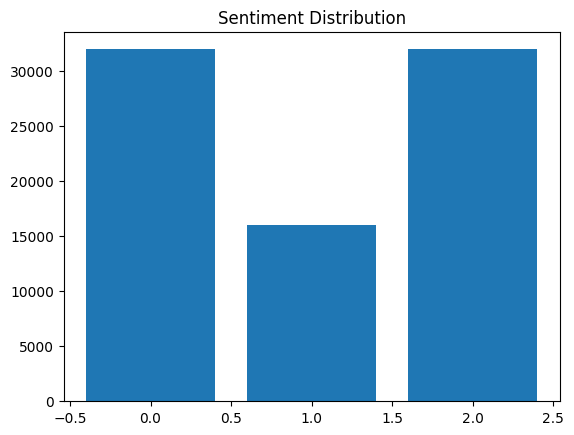

In [ ]:
plot_names = combined_df['sentiment'].value_counts().keys()
plot_values = combined_df['sentiment'].value_counts().values

plt.title('Sentiment Distribution')
plt.bar(plot_names, plot_values)

## **Text Preprocessing**

**References**:
https://www.kaggle.com/code/parulpandey/eda-and-preprocessing-for-bert#4.-Text-Data-Preprocessing

https://aihub.org/2023/03/30/methods-for-addressing-class-imbalance-in-deep-learning-based-natural-language-processing/

The following steps are done in the text-preprocessing steps:

* Lowercasing ✅
* Contractions Removal ✅
* Emoji Removal ✅
* Removing special characters (punctuations, currency signs, digits) ✅
* Stopword Removal and Lemmatization ✅

####**Lowercasing**

In [ ]:
combined_df['Content'] = combined_df['Content'].str.lower()

#### **Creating an nlp object for using spacy**

In [ ]:
nlp = spacy.load("en_core_web_lg")

#### **Applying Cleaning Methods**

#### **Tokenization, Removing Contractions, Emojis, Punctuations, Currencies and Numbers**

In [ ]:
def text_cleaning(text):

  # Removing Contractions
  expanded_text = []
  for word in text.split():
    expanded_text.append(contractions.fix(word))
  expanded_text = ' '.join(expanded_text)
  expanded_text



  # Removing Emojis
  emoj = re.compile("["
        u"\U0001F600-\U0001F64F"  # emoticons
        u"\U0001F300-\U0001F5FF"  # symbols & pictographs
        u"\U0001F680-\U0001F6FF"  # transport & map symbols
        u"\U0001F1E0-\U0001F1FF"  # flags (iOS)
        u"\U00002500-\U00002BEF"  # chinese char
        u"\U00002702-\U000027B0"
        u"\U000024C2-\U0001F251"
        u"\U0001f926-\U0001f937"
        u"\U00010000-\U0010ffff"
        u"\u2640-\u2642"
        u"\u2600-\u2B55"
        u"\u200d"
        u"\u23cf"
        u"\u23e9"
        u"\u231a"
        u"\ufe0f"  # dingbats
        u"\u3030"
                      "]+", re.UNICODE)
  emoji_removed = re.sub(emoj, '', expanded_text)

  # Removing numbers, currencies and punctuations
  doc = nlp(emoji_removed)
  clean = []
  for token in doc:
    if token.ent_type_ == 'MONEY' or token.is_currency or token.like_num or token.is_punct:
      continue
    clean.append(token.text)
  num_removed = ' '.join(clean)

  return num_removed

#### **Applying another cleaning function, removing square brackets, links and words containing numbers and punctuations if any are left after the first round**

In [ ]:
def clean_text(text):
  '''Removing text in square brackets,remove links,remove punctuation
  and remove words containing numbers.'''
  text = re.sub('\[.*?\]', '', text)
  text = re.sub('https?://\S+|www\.\S+', '', text)
  text = re.sub('<.*?>+', '', text)
  text = re.sub('[%s]' % re.escape(string.punctuation), '', text)
  text = re.sub('\n', '', text)
  text = re.sub('\w*\d\w*', '', text)
  return text

In [ ]:
%%time
combined_df['text_clean'] = combined_df['Content'].apply(text_cleaning)

In [ ]:
combined_df.head()

,Rating,Content,Company,sentiment,text_clean
0,1,took too long to arrive. when i had to reautho...,Trust Pilot,0,took too long to arrive when i had to reauthor...
1,1,zero packaging. bought an expensive scanner. t...,Trust Pilot,0,packaging bought an expensive scanner the box ...
2,1,ordered a product only to be told in an automa...,Trust Pilot,0,ordered a product only to be told in an automa...
3,1,"brought used speedlight, unfortunately it arri...",Trust Pilot,0,brought used speedlight unfortunately it arriv...
4,1,really bad experience till now already paid fo...,Trust Pilot,0,really bad experience till now already paid fo...


In [ ]:
%%time
combined_df['cleaned_text'] = combined_df['text_clean'].apply(str).apply(lambda x: clean_text(x))

CPU times: user 1.93 s, sys: 2.09 ms, total: 1.93 s
Wall time: 1.93 s


#### **Raw Content**

In [ ]:
combined_df['Content'][5]

'i bought a used lens with a 9/10 condition rating, with only light cosmetic wear noted in the description. the lens arrived on the assigned day (the only positive of this whole experience), only to find that that window for the focus dial was held on with tape (which was not mentioned at all in the description) and the autofocus did not work at all. very disappointing considering what was advertised.'

#### **Cleaned Content**

In [ ]:
combined_df['cleaned_text'][5]

'i bought a used lens with a condition rating with only light cosmetic wear noted in the description the lens arrived on the assigned day the only positive of this whole experience only to find that that window for the focus dial was held on with tape which was not mentioned at all in the description and the autofocus did not work at all very disappointing considering what was advertised'

#### **Adding a Word Count column**
This is to calculate the no. of words in every review

In [ ]:
combined_df['word_count'] = combined_df['cleaned_text'].apply(lambda x: len(str(x).split()))

In [ ]:
combined_df.head()

,Rating,Content,Company,sentiment,text_clean,cleaned_text,word_count
0,1,took too long to arrive. when i had to reautho...,Trust Pilot,0,took too long to arrive when i had to reauthor...,took too long to arrive when i had to reauthor...,27
1,1,zero packaging. bought an expensive scanner. t...,Trust Pilot,0,packaging bought an expensive scanner the box ...,packaging bought an expensive scanner the box ...,100
2,1,ordered a product only to be told in an automa...,Trust Pilot,0,ordered a product only to be told in an automa...,ordered a product only to be told in an automa...,43
3,1,"brought used speedlight, unfortunately it arri...",Trust Pilot,0,brought used speedlight unfortunately it arriv...,brought used speedlight unfortunately it arriv...,74
4,1,really bad experience till now already paid fo...,Trust Pilot,0,really bad experience till now already paid fo...,really bad experience till now already paid fo...,16


In [ ]:
combined_df = combined_df.drop(['text_clean'], axis = 1)

In [ ]:
combined_df.head()

,Rating,Content,Company,sentiment,cleaned_text,word_count
0,1,took too long to arrive. when i had to reautho...,Trust Pilot,0,took too long to arrive when i had to reauthor...,27
1,1,zero packaging. bought an expensive scanner. t...,Trust Pilot,0,packaging bought an expensive scanner the box ...,100
2,1,ordered a product only to be told in an automa...,Trust Pilot,0,ordered a product only to be told in an automa...,43
3,1,"brought used speedlight, unfortunately it arri...",Trust Pilot,0,brought used speedlight unfortunately it arriv...,74
4,1,really bad experience till now already paid fo...,Trust Pilot,0,really bad experience till now already paid fo...,16


#### **Stopword Removal and Lemmatization**

In [ ]:
def lemmatization(text):
  doc = nlp(text)
  new_string = []

  for word in doc:
    if word.is_stop:
      continue

    new_string.append(word.lemma_)
  return ' '.join(new_string)

In [ ]:
%%time
combined_df['sanitized'] = combined_df['cleaned_text'].apply(lemmatization)

#### **Text without Stopwords and Lemmatized**

In [ ]:
combined_df['cleaned_text'][10]

'equipment sent out as new was clearly used  camera body referred to their service arm for a lens but told by the service centre that they do not repair panasonic lenses having now received the replacement all is as it should be and it powered up in the state expected ready to select country and time the previous device had already had this done and to another time zone so clearly it had been used by someone at some time before shipping the other indicator was a greasy thumb print on the lcd display i had originally decided to cancel the order completely but having experienced a very positive response to the issue i decided that i would be happy with a replacement and this conversation too was very positive the idea of giving me an extra battery was welcome until i found out that it was an olympus look alike rather than an om systems battery i may well have been fine with that but was surprised when i saw it that coupled with the repair information is what led me to star if the last th

#### **Text WITH Stopwords and Lemmatized**

In [ ]:
combined_df['sanitized'][10]

'equipment send new clearly   camera body refer service arm lens tell service centre repair panasonic lense having receive replacement power state expect ready select country time previous device time zone clearly time ship indicator greasy thumb print lcd display originally decide cancel order completely having experience positive response issue decide happy replacement conversation positive idea give extra battery welcome find olympus look alike om system battery fine surprised see couple repair information lead star thing happen'

In [ ]:
combined_df.head()

,Rating,Content,Company,sentiment,cleaned_text,word_count,sanitized
0,1,took too long to arrive. when i had to reautho...,Trust Pilot,0,took too long to arrive when i had to reauthor...,27,take long arrive reauthorise payment tell payp...
1,1,zero packaging. bought an expensive scanner. t...,Trust Pilot,0,packaging bought an expensive scanner the box ...,100,packaging buy expensive scanner box arrive pac...
2,1,ordered a product only to be told in an automa...,Trust Pilot,0,ordered a product only to be told in an automa...,43,order product tell automate email stock cancel...
3,1,"brought used speedlight, unfortunately it arri...",Trust Pilot,0,brought used speedlight unfortunately it arriv...,74,bring speedlight unfortunately arrive faulty t...
4,1,really bad experience till now already paid fo...,Trust Pilot,0,really bad experience till now already paid fo...,16,bad experience till pay product recive


#### **Save Cleaned Combined Dataframe to CSV for future**

In [ ]:
combined_df.to_csv(os.getcwd() + '/CFA_Wex/MyDrive/cleaned_combined_reviews.csv', index=False)

## **Plots**

Reference: https://www.kaggle.com/code/parulpandey/eda-and-preprocessing-for-bert#2.-General-EDA

#### **Sentiment Distribution Plot**

In [ ]:
combined_df['sentiment'].value_counts()

sentiment
0    31974
2    31974
1    15987
Name: count, dtype: int64

In [ ]:
combined_df['sentiment'].value_counts(normalize=True)

sentiment
0    0.4
2    0.4
1    0.2
Name: proportion, dtype: float64

* ~40% of the sentiments are of Positive
* ~20% of the sentiments are of Neutral
* ~40% of the sentiments are of Negative

In [ ]:
fig = px.histogram(combined_df,x="sentiment", color='sentiment', title = 'Sentiment Distribution', labels={'x': 'sentiment', 'y': 'frequency'})
fig.update_layout(bargap=0.2)
fig.show()

#### **Creating Dataframes for Positive, Negative and Neutral Sentiments**

In [ ]:
pos = combined_df[combined_df['sentiment']==2]
neg = combined_df[combined_df['sentiment']==0]
neutral = combined_df[combined_df['sentiment']==1]

#### **Positive Rating Reviews Word count**

In [ ]:
fig = px.histogram(pos,x="word_count", title = 'Positive Rating Word Count', labels={'word_count': 'review length'})
fig.update_layout(bargap=0.2)
fig.show()

#### **Neutral Rating Reviews Word count**

In [ ]:
fig = px.histogram(neutral,x="word_count", title = 'Neutral Rating Word Count', labels={'word_count': 'review length'})
fig.update_layout(bargap=0.2)
fig.show()

#### **Negative Rating Reviews Word count**

In [ ]:
fig = px.histogram(neg,x="word_count", title = 'Negative Rating Word Count', labels={'word_count': 'review length'})
fig.update_layout(bargap=0.2)
fig.show()

#### **Word Frequency Plot**
**Plotting** the most common words in the dataset

In [ ]:
count = 50

In [ ]:
word_count = Counter()
for text in combined_df['sanitized']:
  for word in text.split():
    word_count[word] +=1

freq_list = word_count.most_common(count)

words = []
freq = []
for tuple_item in freq_list:
  words.append(tuple_item[0])
  freq.append(tuple_item[1])
words = np.array(words)
freq = np.array(freq)

fig = px.bar(x= words, y=freq, title = 'Word Frequency', labels ={'x':'Word', 'y':'Frequency'})
fig.show()

#### **Top 50 Words in Positive sentiments**

In [ ]:
word_count = Counter()
for text in pos['sanitized']:
  for word in text.split():
    word_count[word] +=1

freq_list = word_count.most_common(count)

words = []
freq = []
for tuple_item in freq_list:
  words.append(tuple_item[0])
  freq.append(tuple_item[1])
words = np.array(words)
freq = np.array(freq)

fig = px.bar(x= words, y=freq, title = 'Word Frequency', labels ={'x':'Word', 'y':'Frequency'}, color_discrete_sequence =['green'])
fig.show()

#### **Top 50 Words in Neutral sentiments**

In [ ]:
word_count = Counter()
for text in neutral['sanitized']:
  for word in text.split():
    word_count[word] +=1

freq_list = word_count.most_common(count)

words = []
freq = []
for tuple_item in freq_list:
  words.append(tuple_item[0])
  freq.append(tuple_item[1])
words = np.array(words)
freq = np.array(freq)

fig = px.bar(x= words, y=freq, title = 'Word Frequency', labels ={'x':'Word', 'y':'Frequency'}, color_discrete_sequence =['orange'])
fig.show()

#### **Top 50 Words in Negative sentiments**

In [ ]:
word_count = Counter()
for text in neg['sanitized']:
  for word in text.split():
    word_count[word] +=1

freq_list = word_count.most_common(count)

words = []
freq = []
for tuple_item in freq_list:
  words.append(tuple_item[0])
  freq.append(tuple_item[1])
words = np.array(words)
freq = np.array(freq)

fig = px.bar(x= words, y=freq, title = 'Word Frequency', labels ={'x':'Word', 'y':'Frequency'}, color_discrete_sequence =['orangered'])
fig.show()

#### **Box Plotting Sentiments**

In [ ]:
fig = px.box(combined_df,x="sentiment", y = 'word_count', title = 'Box plot for Sentiments',points="all", color='sentiment', labels={'word_count':'frequency'})
fig.show()

#### **Wordcloud**

In [ ]:
from wordcloud import WordCloud, STOPWORDS

In [ ]:
comment_words = ''
stopwords = set(STOPWORDS)
# iterate through the csv file
for val in combined_df['cleaned_text']:

    # typecaste each val to string
    val = str(val)

    # split the value
    tokens = val.split()

    # Converts each token into lowercase
    for i in range(len(tokens)):
        tokens[i] = tokens[i].lower()

    comment_words += " ".join(tokens)+" "

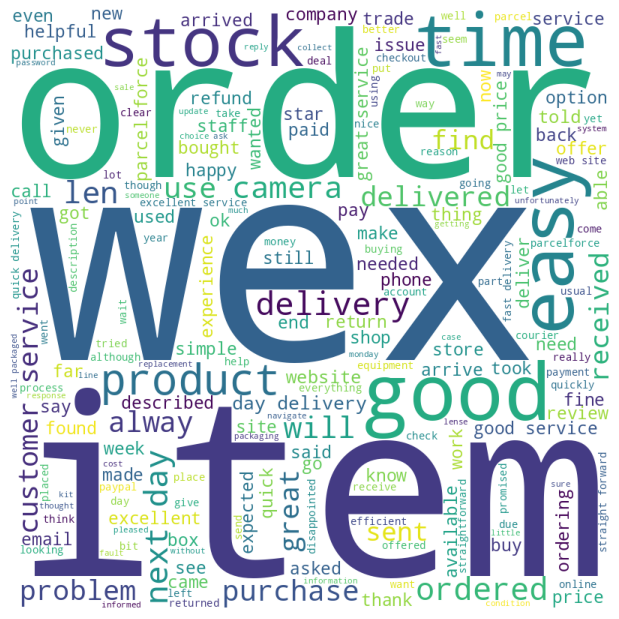

In [ ]:
wordcloud = WordCloud(width = 800, height = 800,
                background_color ='white',
                stopwords = stopwords,
                min_font_size = 10).generate(comment_words)

# plot the WordCloud image
plt.figure(figsize = (6, 6), facecolor = None)
plt.imshow(wordcloud)
plt.axis("off")
plt.tight_layout(pad = 0)

plt.show()

## **Model Building**

**References**:
https://www.kaggle.com/code/abhishek/approaching-almost-any-nlp-problem-on-kaggle

#### **Read saved Combined Dataframe to avoid running previous code all over again to save time**

In [ ]:
combined_df = pd.read_csv(path + '/cleaned_combined_reviews.csv')

In [ ]:
combined_df['Rating'].value_counts()

Rating
1    15987
2    15987
3    15987
4    15987
5    15987
Name: count, dtype: int64

#### **Restricting records to 6000 since original records taking > 1 hour computational time**

In [ ]:
def trim_dataframe(df, max_records_per_class=6000):
    trimmed_df = df.groupby('Rating', group_keys=False).apply(lambda x: x.sample(min(len(x), max_records_per_class)))
    return trimmed_df

combined_df = trim_dataframe(combined_df, max_records_per_class=6000)

# Verify the trimming
print(combined_df['Rating'].value_counts())

Rating
1    6000
2    6000
3    6000
4    6000
5    6000
Name: count, dtype: int64


#### **Tain, Test and Val Split**

In [ ]:
X = combined_df.sanitized.values.astype('U')
y = combined_df.sentiment

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y, test_size=0.2, random_state=42, shuffle=True)

In [ ]:
print(X_train.shape)
print(X_test.shape)

(24000,)
(6000,)


In [ ]:
y_train.value_counts(), y_test.value_counts()

(sentiment
 2    9600
 0    9600
 1    4800
 Name: count, dtype: int64,
 sentiment
 2    2400
 0    2400
 1    1200
 Name: count, dtype: int64)

#### **ML Pipelines**: https://www.freecodecamp.org/news/machine-learning-pipeline/

##### **Pipeline for Model Building**

In [ ]:
models = [LogisticRegression(random_state=1),
          RandomForestClassifier(random_state=1),
          KNeighborsClassifier(n_neighbors = 5),
          SVC(random_state=1),
          MultinomialNB()]
results = []
f1scores = []

In [ ]:
%%time
for model in models:
  pipeline = Pipeline([
    ('vectorizer_tri_grams', TfidfVectorizer()),
    ('model', model)])
  pipeline.fit(X_train, y_train)
  scores = pipeline.score(X_test, y_test)
  predicted_val = pipeline.predict(X_test)
  f1_scores = f1_score(y_test, predicted_val, average='macro')
  results.append(scores)
  f1scores.append(f1_scores)

CPU times: user 8min 53s, sys: 3.58 s, total: 8min 57s
Wall time: 9min 13s


In [ ]:
for model, accuracy, f1 in zip(models, results, f1scores):
  print(f"Model: {model} >> Accuracy: {round(np.mean(accuracy), 3)}   |  F1 Score: {round(np.mean(f1), 3)}")

Model: LogisticRegression(random_state=1) >> Accuracy: 0.509   |  F1 Score: 0.397
Model: RandomForestClassifier(random_state=1) >> Accuracy: 0.44   |  F1 Score: 0.366
Model: KNeighborsClassifier() >> Accuracy: 0.452   |  F1 Score: 0.354
Model: SVC(random_state=1) >> Accuracy: 0.491   |  F1 Score: 0.38
Model: MultinomialNB() >> Accuracy: 0.522   |  F1 Score: 0.392


#### **Using the models with best accuracies and F1 scores**

* Logistic Regression
* SVC
* Random Forest

#### **Hyperparameter Tuning**
**Using GridSearchCV for Hyperparameter Tuning for the Baseline ML models**

In [ ]:
param_grid_lr = {
    'model__penalty': ['l1', 'l2'],
    'model__C': [0.1, 1, 10],
    'model__solver': ['liblinear'],
    'model__max_iter': [100]
}

param_grid_rf = {
    'model__criterion': ['gini'],
    'model__min_samples_split': [4]
}

param_grid_svc = {
    'model__C': [1, 10],
    'model__gamma': [0.01, 0.001],
    'model__kernel': ['rbf']
}

In [ ]:
param_grid = [param_grid_lr, param_grid_rf, param_grid_svc]
models_final = [LogisticRegression(random_state=1),
          RandomForestClassifier(random_state=1),
          SVC(random_state=1)]

In [ ]:
%%time

best_params = []
best_estimator = []

for model, grid_params in zip(models_final, param_grid):
  print(f"Model: {model}")
  clf_pipeline = Pipeline(steps =[('vectorizer_tri_grams', TfidfVectorizer()),('model', model)])
  gs= GridSearchCV(clf_pipeline, grid_params, cv=5, scoring='accuracy', refit=True,verbose=3)
  gs.fit(X_train, y_train)
  best_params.append(gs.best_params_)
  best_estimator.append(gs.best_estimator_)

Model: LogisticRegression(random_state=1)
Fitting 5 folds for each of 6 candidates, totalling 30 fits
[CV 1/5] END model__C=0.1, model__max_iter=100, model__penalty=l1, model__solver=liblinear;, score=0.503 total time=   1.0s
[CV 2/5] END model__C=0.1, model__max_iter=100, model__penalty=l1, model__solver=liblinear;, score=0.499 total time=   0.8s
[CV 3/5] END model__C=0.1, model__max_iter=100, model__penalty=l1, model__solver=liblinear;, score=0.512 total time=   0.8s
[CV 4/5] END model__C=0.1, model__max_iter=100, model__penalty=l1, model__solver=liblinear;, score=0.515 total time=   0.8s
[CV 5/5] END model__C=0.1, model__max_iter=100, model__penalty=l1, model__solver=liblinear;, score=0.506 total time=   0.8s
[CV 1/5] END model__C=0.1, model__max_iter=100, model__penalty=l2, model__solver=liblinear;, score=0.519 total time=   0.9s
[CV 2/5] END model__C=0.1, model__max_iter=100, model__penalty=l2, model__solver=liblinear;, score=0.514 total time=   0.9s
[CV 3/5] END model__C=0.1, mod

#### **Best Hyper Parameters**

In [ ]:
abrv = ['lr','rf','svc']
for a, p, e in zip(abrv,best_params,best_estimator):
    print(f"""Model : {a.upper()}
                        Best Parameter : {p}
                        Best Estimator : {e} \n""")

Model : LR
                        Best Parameter : {'model__C': 0.1, 'model__max_iter': 100, 'model__penalty': 'l2', 'model__solver': 'liblinear'}
                        Best Estimator : Pipeline(steps=[('vectorizer_tri_grams', TfidfVectorizer()),
                ('model',
                 LogisticRegression(C=0.1, random_state=1,
                                    solver='liblinear'))]) 

Model : RF
                        Best Parameter : {'model__criterion': 'gini', 'model__min_samples_split': 4}
                        Best Estimator : Pipeline(steps=[('vectorizer_tri_grams', TfidfVectorizer()),
                ('model',
                 RandomForestClassifier(min_samples_split=4, random_state=1))]) 

Model : SVC
                        Best Parameter : {'model__C': 10, 'model__gamma': 0.01, 'model__kernel': 'rbf'}
                        Best Estimator : Pipeline(steps=[('vectorizer_tri_grams', TfidfVectorizer()),
                ('model', SVC(C=10, gamma=0.01, random_state=1))

#### **Models with Hyper Tuned Parameters**

In [ ]:
models_hyp = [LogisticRegression(C=0.1, penalty='l2', max_iter=100, solver='liblinear'),
          RandomForestClassifier(criterion='gini', min_samples_split=4,random_state=1),
          SVC(C=10, gamma=0.01, kernel= 'rbf', random_state=1)]

models_hyp_names = ['Logistic Regression', 'RandomForest Classifier', 'SVC']
results_hyper = []
f1scores_hyper = []
model_stored = []

In [ ]:
%%time
for model in models_hyp:
  pipeline = Pipeline([
    ('vectorizer_tri_grams', TfidfVectorizer()),
    ('model', model)])
  pipeline.fit(X_train, y_train)
  scores = pipeline.score(X_test, y_test)
  predicted_val = pipeline.predict(X_test)
  f1_scores = f1_score(y_test, predicted_val, average='macro')
  results_hyper.append(scores)
  f1scores_hyper.append(f1_scores)

CPU times: user 3min 21s, sys: 554 ms, total: 3min 21s
Wall time: 3min 24s


In [ ]:
for model, accuracy, f1 in zip(models_hyp_names, results_hyper, f1scores_hyper):
    print(f"""Model: {model}
                                Accuracy: {round(np.mean(accuracy), 4)}
                                F1 Score: {round(np.mean(f1), 4)}\n""")

Model: Logistic Regression
                                Accuracy: 0.5283
                                F1 Score: 0.3922

Model: RandomForest Classifier
                                Accuracy: 0.441
                                F1 Score: 0.3651

Model: SVC
                                Accuracy: 0.5248
                                F1 Score: 0.3896



In [ ]:
f1scores = [f1scores[0], f1scores[1], f1scores[4]]

In [ ]:
results = [results[0], results[1], results[4]]

#### **Results**
**Models Comparison**

In [ ]:
#Creating list to store F1 scores with hyperparameters
df_plot = pd.DataFrame( {"Models": ["Logistic Regression",
                   "Random Forest",
                   "SVC"]*2,
          "F1 Scores": f1scores + f1scores_hyper,
          "Accuracy": results + results_hyper,
          "Normal/Hyper":(["Normal"]*3+["Hypertuned"]*3)
         })
df_plot

,Models,F1 Scores,Accuracy,Normal/Hyper
0,Logistic Regression,0.396636,0.509000,Normal
1,Random Forest,0.366192,0.440167,Normal
2,SVC,0.391984,0.522000,Normal
3,Logistic Regression,0.392184,0.528333,Hypertuned
4,Random Forest,0.365080,0.441000,Hypertuned
5,SVC,0.389604,0.524833,Hypertuned


Accuracy of SVC and Logistic Regression improved after hyperparameter tuning!

##### **SVC**

In [ ]:
%%time
svc = SVC(C=10, gamma=0.01, kernel= 'rbf', random_state=1)

model_svc = Pipeline([
    ('vectorizer_tri_grams', TfidfVectorizer()),
    ('model', svc)])

model_svc.fit(X_train, y_train)
predict_svc = model_svc.predict(X_test)
score = model_svc.score(X_test, y_test)
print(score)

0.5248333333333334


##### **Evaluation / Confusion Matrix**

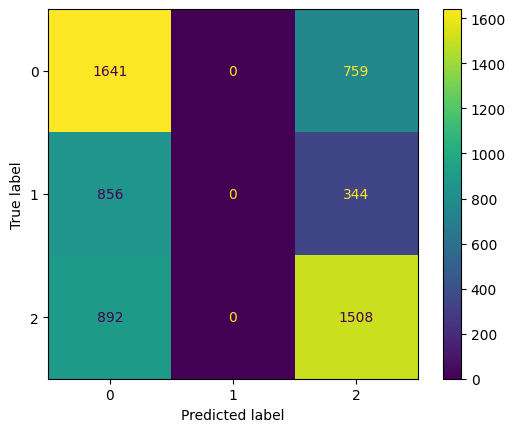

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_test, predict_svc)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix)
cm_display.plot()
plt.show()

In [ ]:
print(classification_report(y_test, predict_svc, labels=[0, 1, 2]))

              precision    recall  f1-score   support

           0       0.48      0.68      0.57      2400
           1       0.00      0.00      0.00      1200
           2       0.58      0.63      0.60      2400

    accuracy                           0.52      6000
   macro avg       0.35      0.44      0.39      6000
weighted avg       0.42      0.52      0.47      6000



##### **Logistic Regression**

In [ ]:
%%time
logistic_regression = LogisticRegression(C=0.1, penalty='l2', max_iter=100, solver='liblinear')

model_lr = Pipeline([
    ('vectorizer_tri_grams', TfidfVectorizer()),
    ('model', logistic_regression)])

model_lr.fit(X_train, y_train)
predict_lr = model_lr.predict(X_test)
score = model_lr.score(X_test, y_test)
print(score)

0.5283333333333333
CPU times: user 1.81 s, sys: 7.75 ms, total: 1.82 s
Wall time: 3.92 s


##### **Evaluation / Confusion Matrix**

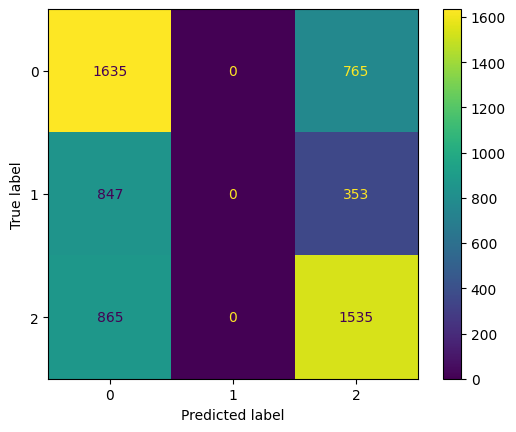

In [ ]:
confusion_matrix = metrics.confusion_matrix(y_test, predict_lr)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix)
cm_display.plot()
plt.show()

In [ ]:
print(classification_report(y_test, predict_lr, labels=[0, 1, 2]))

              precision    recall  f1-score   support

           0       0.49      0.68      0.57      2400
           1       0.00      0.00      0.00      1200
           2       0.58      0.64      0.61      2400

    accuracy                           0.53      6000
   macro avg       0.36      0.44      0.39      6000
weighted avg       0.43      0.53      0.47      6000



#### **Saving SVC Model**

In [ ]:
import pickle

filename = path + '/model_svc.sav'
pickle.dump(model_svc, open(filename, 'wb'))

#### **Saving Logistic Regression Model**

In [ ]:
filename = path + '/model_lr.sav'
pickle.dump(model_lr, open(filename, 'wb'))

## **Adding Predictions to the Dataset**

### **Applying Cleaning Methods**

In [ ]:
df = pd.read_csv(path + '/combined_reviews.csv')

In [ ]:
df.head()

,Rating,Content,Company,sentiment
0,1,Took too long to arrive. When I had to reautho...,Trust Pilot,0
1,1,Zero packaging. Bought an expensive scanner. T...,Trust Pilot,0
2,1,Ordered a product only to be told in an automa...,Trust Pilot,0
3,1,"Brought used speedlight, unfortunately it arri...",Trust Pilot,0
4,1,Really bad experience till now already paid fo...,Trust Pilot,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 79935 entries, 0 to 79934
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   Rating     79935 non-null  int64 
 1   Content    79935 non-null  object
 2   Company    79935 non-null  object
 3   sentiment  79935 non-null  int64 
dtypes: int64(2), object(2)
memory usage: 2.4+ MB


In [ ]:
df = trim_dataframe(df, max_records_per_class=1000)

# Verify the trimming
print(df['Rating'].value_counts())

Rating
1    1000
2    1000
3    1000
4    1000
5    1000
Name: count, dtype: int64


In [ ]:
%%time
df['text_clean'] = df['Content'].apply(text_cleaning)

CPU times: user 1min 10s, sys: 238 ms, total: 1min 10s
Wall time: 1min 11s


In [ ]:
df['cleaned_text'] = df['text_clean'].apply(str).apply(lambda x: clean_text(x))

In [ ]:
%%time
df['sanitized'] = df['cleaned_text'].apply(lemmatization)

### **Getting SVC Model Predictions**

In [ ]:
%%time
X = df.sanitized.values.astype('U')
predictions = model_svc.predict(X)

In [ ]:
df['predictions'] = predictions

In [ ]:
final_df = df.drop(['text_clean', 'cleaned_text','sanitized'], axis = 1)

In [ ]:
final_df.head()

,Rating,Content,Company,sentiment,predictions
61193,1,Goodservice,Power Reviews,0,0
30336,1,"Ordered a Red D3300, received a black one, ask...",Power Reviews,0,0
62446,1,Could not find item on web site so phone and g...,Power Reviews,0,2
15899,1,Our Initial telephone contact with the Sales d...,Trust Pilot,0,0
30581,1,Dreadful log in dreadful nearly gave up,Power Reviews,0,0


In [ ]:
final_df['sentiment'].value_counts()

sentiment
0    2000
2    2000
1    1000
Name: count, dtype: int64

In [ ]:
final_df['predictions'].value_counts()

predictions
0    2852
2    2148
Name: count, dtype: int64

### **True vs Predicted Labels**

In [ ]:
names_sent = df['sentiment'].value_counts().keys()
values_sent = df['sentiment'].value_counts().values

In [ ]:
names_pred = df['predictions'].value_counts().keys()
values_pred = df['predictions'].value_counts().values

In [ ]:
# Create the plot
fig = go.Figure(data=[
    go.Bar(
        name='True Labels',
        x=names_sent,
        y=values_sent,
        text=values_sent,
        textposition='auto'
    ),
    go.Bar(
        name='Predicted Labels',
        x=names_pred,
        y=values_pred,
        text=values_pred,
        textposition='auto'
    )
])

# Customize layout
fig.update_layout(
    title='True vs Predicted Labels',
    xaxis_title='Labels',
    yaxis_title='Values',
    barmode='group'
)

fig.show()